Video Game Reviews Text Analysis

By Fei Guo, Victor Li, Jonathan Lin, Xinyu Zheng

INFX 575 Data review and get advanced data analysis

In [391]:
import pandas as pd
import numpy as np
import re

df = pd.read_csv("results.csv", encoding='utf-8')

In [17]:
df.mean()

score               5.820811
score_100          70.764865
review_length    1092.237297
dtype: float64

In [21]:
df.groupby(['site']).agg([np.sum, np.mean, np.std])

score                     score_100                        \
               sum      mean       std       sum       mean        std   
site                                                                     
GameSpot    2756.0  6.561905  1.630109     27560  65.619048  16.301094   
Giant Bomb  2323.0  3.525038  0.969392     46460  70.500759  19.387849   
IGN         5689.5  7.379377  1.482715     56895  73.793774  14.827152   

           review_length                           
                     sum         mean         std  
site                                               
GameSpot          524649  1249.164286  415.072647  
Giant Bomb        800745  1215.091047  465.193875  
IGN               695245   901.744488  334.284241

In [25]:
df.groupby(['game']).agg([np.sum, np.mean, np.count_nonzero])

score                      \
                                                     sum  mean count_nonzero   
game                                                                           
#IDARB                                              15.5  7.75             2   
'Splosion Man                                        4.0  4.00             1   
007 Legends                                          2.0  2.00             1   
1001 Spikes                                         16.0  8.00             2   
140                                                  8.0  8.00             1   
1942: Joint Strike                                   3.0  3.00             1   
2014 FIFA World Cup Brazil                           7.5  7.50             1   
3D Dot Game Heroes                                   3.0  3.00             1   
50 Cent: Blood on the Sand                           3.0  3.00             1   
80 Days                                              9.0  9.00             1   
9.03m                                                5.0  5.00             1   
A Bird Story                                        16.8  8.40             2   
A Boy and His Blob                                   4.0  4.00             1   
Aaru's Awakening                                    10.7  5.35             2   
Abyss Odyssey                                        6.7  6.70             1   
Ace Combat Infinity                                  6.0  6.00             1   
Action Henk                                          7.0  7.00             1   
Adventure Time: Explore the Dungeon Because I D...   2.0  2.00             1   
Adventure Time: Explore the Dungeon Because I D...   3.5  3.50             1   
Adventure Time: Hey Ice King! Whyâ€™d you steal o...   3.0  3.00             1   
Adventure Time: The Secret of the Nameless Kingdom   6.0  6.00             1   
Affordable Space Adventures                          8.0  8.00             1   
Afro Samurai                                         3.0  3.00             1   
Age of Booty                                         4.0  4.00             1   
Age of Wonders III                                  15.1  7.55             2   
Age of Wushu                                         7.0  7.00             1   
Air Conflicts: Vietnam                               7.0  3.50             2   
Air Control                                          1.0  1.00             1   
AirMech Arena                                        5.5  5.50             1   
Akiba's Trip: Undead & Undressed                     4.0  4.00             1   
...                                                  ...   ...           ...   
X-Men: Destiny                                       2.0  2.00             1   
XCOM: Enemy Unknown                                 13.5  6.75             2   
XCOM: Enemy Within                                   8.0  8.00             1   
XCOM: Enemy Within -- Commander Edition              9.0  9.00             1   
Xenoblade Chronicles                                16.7  8.35             2   
Xenonauts                                           15.8  7.90             2   
Xeodrifter                                           6.5  6.50             1   
Yaiba: Ninja Gaiden Z                                5.6  5.60             1   
Yakuza 4                                             3.0  3.00             1   
Yoshi's New Island                                  10.9  5.45             2   
You Don't Know Jack                                  4.0  4.00             1   
You're In the Movies                                 3.0  3.00             1   
Young Justice: Legacy                                4.8  4.80             1   
Ys: Memories of Celceta                             15.5  7.75             2   
Zeno Clash                                           4.0  4.00             1   
Zeno Clash II                                        6.4  6.40             1   
Ziggurat                                         

In [31]:
df.groupby(['game']).count().sort(['date'])

,date,link,platforms,review,reviewer,score,score_100,site,review_length
game,,,,,,,,,
Might & Magic X: Legacy,1,1,1,1,1,1,1,1,1
NES Remix 2,1,1,1,1,1,1,1,1,1
NHL 12,1,1,1,1,1,1,1,1,1
NHL 13,1,1,1,1,1,1,1,1,1
The Weaponographist,1,1,1,1,1,1,1,1,1
The Walking Dead: The Game -- Episode 5: No Time Left,1,1,1,1,1,1,1,1,1
The Walking Dead: Survival Instinct,1,1,1,1,1,1,1,1,1
Naruto Shippuden: Ultimate Ninja Storm 3 Full Burst,1,1,1,1,1,1,1,1,1
Natural Doctrine,1,1,1,1,1,1,1,1,1


In [44]:
df.groupby(['reviewer']).count('review').sort('review', ascending=False)

,date,game,link,platforms,review,score,score_100,site,review_length
reviewer,,,,,,,,,
Jeff Gerstmann,256,256,256,256,256,256,256,256,256
Brad Shoemaker,130,130,130,126,130,130,130,130,130
Alex Navarro,107,107,107,107,107,107,107,107,107
Ryan Davis,106,106,106,106,106,106,106,106,106
Vince Ingenito,57,57,57,57,57,57,57,57,57
Kevin VanOrd,54,54,54,54,54,54,54,54,54
Dan Stapleton,47,47,47,47,47,47,47,47,47
Colin Moriarty,44,44,44,44,44,44,44,44,44
Leif Johnson,44,44,44,44,44,44,44,44,44


In [46]:
df.groupby('reviewer').review.nunique

<bound method SeriesGroupBy.nunique of <pandas.core.groupby.SeriesGroupBy object at 0x000000000F1E0940>>

In [74]:
p = df.groupby(['reviewer']).score_100.agg([np.mean]).sort('mean', ascending=False)

In [66]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx
%matplotlib inline
from pandas.tools.plotting import scatter_matrix
matplotlib.style.use('ggplot')

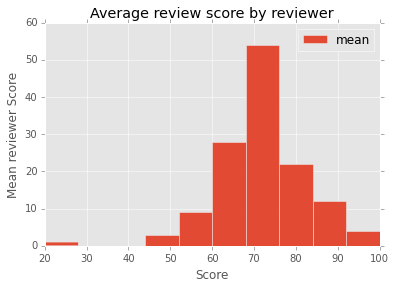

In [86]:
p1 = p.plot(kind='hist', title='Average review score by reviewer')
p1.set_xlabel('Score')
p1.set_ylabel('Mean reviewer Score')
plt.savefig('mean_review_score.png')

This indicates that reviewers tend to score games around the 70 to 80 point mark

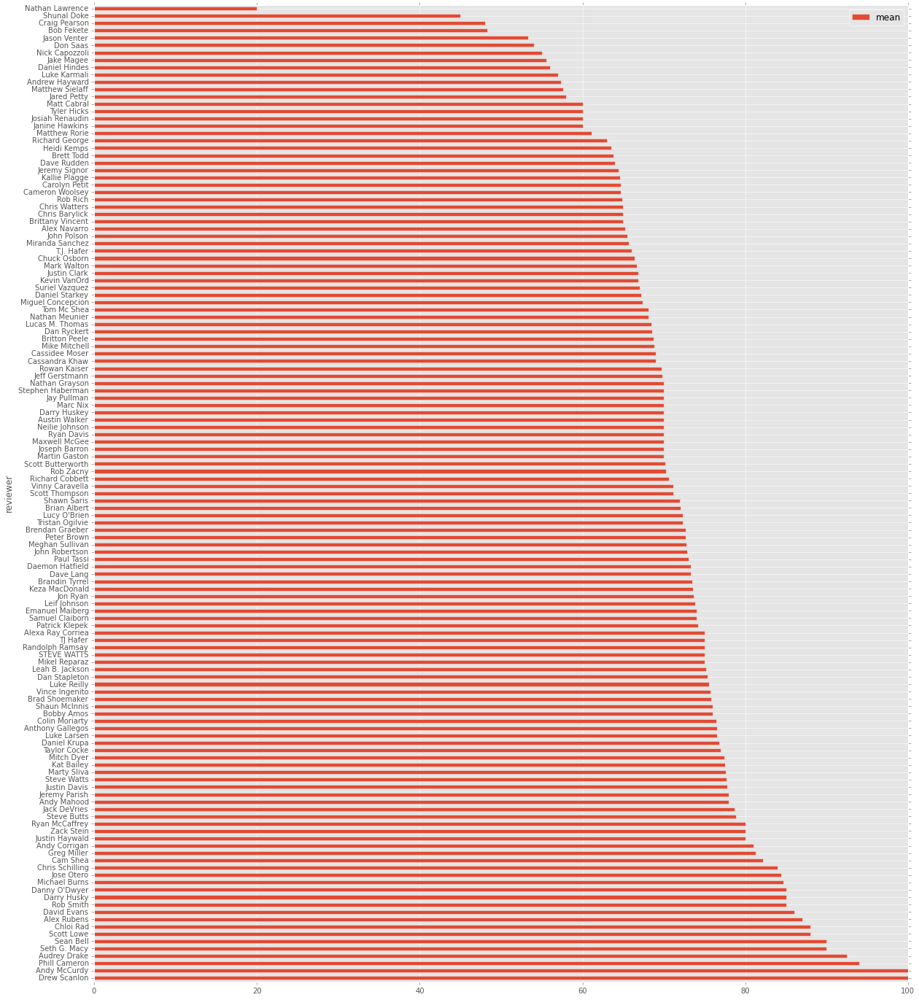

In [88]:
p.plot(kind='barh', figsize=(20, 24))
plt.savefig('average_review_score.png')

In [93]:
p[(p['mean']>71)]

,mean
reviewer,
Drew Scanlon,100.000000
Andy McCurdy,100.000000
Phill Cameron,94.000000
Audrey Drake,92.500000
Seth G. Macy,90.000000
Sean Bell,90.000000
Scott Lowe,88.000000
Chloi Rad,88.000000
Alex Rubens,87.000000


In [119]:
b = df.groupby(['reviewer'])

In [126]:
m = b.mean().sort('review_length', ascending=False)

In [144]:
x = pd.Series(m['review_length'])
y = pd.Series(m['score_100'])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000000002137C3C8>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x0000000029936208>]], dtype=object)

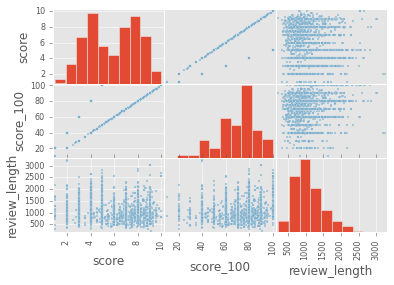

In [151]:
scatter_matrix(df)

In [152]:
rev = pd.Series(df['review'])

In [155]:
import nltk
from nltk import bigrams
from nltk.util import ngrams

In [159]:
mylist = list(rev)

In [166]:
# download a bunch of Natural Language Processing libraries from the Natural Language Toolkit
# http://www.nltk.org/
import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from nltk.probability import FreqDist


import os

In [177]:
# Gensim is Topic modeling for humans
import logging, gensim, bz2
from gensim import corpora, models, similarities
from gensim.models.ldamodel import LdaModel
import requests
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.probability import *
import math
import itertools
import numpy as np

In [175]:
# https://radimrehurek.com/gensim/tut1.html
stoplist = stopwords.words('english')
texts = [[word for word in document.lower().split() if word not in stoplist]
         for document in mylist]

# remove words that appear only once
from collections import defaultdict
frequency = defaultdict(int)
for text in texts:
    for token in text:
        frequency[token] += 1

texts = [[token for token in text if frequency[token] > 1]
         for text in texts]

# from pprint import pprint
# use to print all unigrams
# pprint(texts)

In [179]:
# create a dictionary and corpus from the text document using Gensim
dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]

# num_topics specifies the number of topics to find
lsi = models.LsiModel(corpus_tfidf, id2word=dictionary, num_topics=2)
corpus_lsi = lsi[corpus_tfidf] 
# print out lists of unigrams per topic topics
# using Latent Semantic Analysis
lsi.print_topics(10)

[u'0.113*"\'\'," + 0.079*"you\'ll" + 0.072*"it\'s" + 0.065*"you\'re" + 0.057*"game\'s" + 0.053*"2" + 0.053*"mode" + 0.053*"enemies" + 0.052*"players" + 0.050*"characters"',
 u'-0.680*"=" + -0.359*"{\\n" + -0.308*"var" + -0.159*"+" + -0.137*"+=" + -0.137*"}\\n" + -0.120*"?" + -0.118*":" + -0.103*">" + -0.103*"windowlocation"']

In [181]:
# serialize the sample texts as a corpus file
corpora.MmCorpus.serialize('output/corpus.mm', corpus)

In [182]:
# load the word mapping dictionary
id2word = dictionary
# load the sample corpus 
mm = gensim.corpora.MmCorpus('output/corpus.mm')

In [183]:
print(mm)

MmCorpus(1850 documents, 46881 features, 831272 non-zero entries)


In [262]:
print rev

0       All these karaoke video games have got it all ...
1       Haze attempts to deal with the concept of wart...
2       Metal Gear Solid 4: Guns of the Patriots is an...
3       This week's Xbox Live Arcade release is Poker ...
4       Lots of games have explosions--with all the co...
5       It's easy to imagine a day when we're all jade...
6       As much as I appreciated the way 2002’s The Bo...
7       Burnout Paradise is an amazing open-world raci...
8       I want to be Professor Layton when I grow up. ...
9       Super Smash Bros. Brawl is a game that's pract...
10      We're not there yet, but we're getting closer ...
11      Rocketmen: Axis of Evil takes the classic dual...
12      It's rare for a game publisher to have an imme...
13      With a campaign that's more of a different tak...
14      Bowling pins. Toilet seats. Drive shafts. Deer...
15      Here's that Mayan-themed Xbox Live Arcade puzz...
16      Viking: Battle for Asgard has some really grea...
17      Hot Sh

In [294]:
# tokenize our strings 
tokens = [word_tokenize(toy) for toy in rev]

# use English stop words
stop = stopwords.words('english')

# Strip stopwords
toy_strip   = [[word.lower() for word in document if not word in stop] for document in tokens]

# Snowball Stem words by English
# Stem words
stemmer = SnowballStemmer("english")
toy_stems = [[stemmer.stem(word) for word in texts] for texts in toy_strip]

In [305]:
# https://gist.github.com/ameyavilankar/10347201
word_list = []
def preprocess(sentence):
    sentence = sentence.lower()
    tokenizer = RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(sentence)
    filtered_words = [w for w in tokens if not w in stopwords.words('english')]
    # return " ".join(filtered_words)
    return filtered_words

In [396]:
# https://gist.github.com/ameyavilankar/10347201
sentence_list = []
def preprocess2(sentence):
    sentence = sentence.lower()
    tokenizer = RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(sentence)
    filtered_words = [w for w in tokens if not w in stopwords.words('english')]
    return " ".join(filtered_words)

In [325]:
word_list = []
wordy = []
for i in rev:
    wordy += preprocess(i)
    word_list.append(preprocess(i))

In [387]:
print word_list

[[u'karaoke', u'video', u'games', u'got', u'wrong', u'focus', u'scoring', u'based', u'well', u'emulate', u'pitch', u'cadence', u'original', u'song', u'actual', u'karaoke', u'actually', u'getting', u'singing', u'songs', u'little', u'well', u'sing', u'like', u'dude', u'creed', u'whatever', u'embarrassment', u'self', u'deprecation', u'making', u'song', u'public', u'drunkenness', u'jumping', u'seat', u'like', u'lunatic', u'rushing', u'whatever', u'passes', u'stage', u'friend', u'got', u'sing', u'build', u'buttercup', u'back', u'playstation', u'2', u'sony', u'singstar', u'series', u'popular', u'provided', u'basic', u'ability', u'judge', u'singing', u'playstation', u'3', u'provides', u'something', u'closely', u'resembles', u'karaoke', u'nastytime', u'course', u'basic', u'concept', u'singstar', u'hasn', u'really', u'changed', u'game', u'provides', u'players', u'songs', u'sing', u'screen', u'display', u'shows', u'pitches', u'hitting', u'words', u'sing', u'closer', u'get', u'higher', u'score', 

In [389]:
# create a dictionary of stems 
toy_dictionary = corpora.Dictionary(word_list)
print(toy_dictionary.token2id)

{u'fawn': 7963, u'mustachio': 38542, u'askew': 24849, u'chameleons': 8213, u'spiders': 9075, u'hanging': 3392, u'woody': 39271, u'trawling': 32387, u'uexplore': 34974, u'comically': 11479, u'localized': 15536, u'spidery': 11832, u'movesets': 18265, u'canes': 39219, u'unpaused': 35537, u'originality': 3561, u'grimsd\xf3tt\xedr': 15575, u'halfways': 37749, u'crossbar': 26919, u'rickman': 37515, u'midgame': 35065, u'wracked': 35254, u'grenadiers': 32351, u'appropriation': 11124, u'seldom': 25335, u'strictest': 33878, u'bringing': 2513, u'prizing': 35715, u'jrpg': 13841, u'revelers': 20002, u'wooded': 26071, u'spacy': 35036, u'grueling': 12541, u'wooden': 7098, u'wednesday': 22888, u'ambushing': 13461, u'woods': 13707, u'crotch': 18039, u'asami': 27603, u'stereotypical': 16651, u'busybody': 31277, u'guardsmen': 30361, u'sooty': 18670, u'rebuilding': 18582, u'scrapes': 7694, u'scraper': 38073, u'270': 32520, u'miniatures': 36823, u'sustaining': 25515, u'reengineering': 14895, u'scraped': 92

In [392]:
toys_df = pd.DataFrame(toy_dictionary.values(), columns=['words'])

In [393]:
word_list_df = pd.DataFrame(word_list)

In [405]:
sentence_list = []
for i in rev:
    # sentence_list += preprocess2(i)
    sentence_list.append(preprocess2(i))

In [431]:
# create a stop word only column to new dataframe
df_sl = pd.DataFrame(sentence_list)
df_sl.columns = ['processed']
df_new = pd.concat([df, df_sl], axis=1)

In [438]:
df_new.to_csv('updated_results.csv', encoding='utf-8')

In [443]:
ign_new = df_new.loc[(df_new['site'] == "IGN")]

In [327]:
from collections import Counter
tally=Counter()
for word in wordy:
    tally[word] += 1
tally

Counter({u'game': 15777, u'like': 8200, u'one': 7381, u'time': 5465, u're': 4681, u'even': 4522, u'new': 4385, u'way': 4178, u'get': 4150, u'also': 4130, u'much': 3683, u'games': 3625, u'play': 3599, u'n': 3244, u'make': 3226, u'though': 3197, u'around': 3130, u'll': 3022, u'first': 2983, u'well': 2926, u'world': 2901, u'story': 2901, u'still': 2677, u'little': 2628, u'every': 2561, u'two': 2554, u'back': 2404, u'feel': 2404, u'mode': 2396, u'characters': 2380, u'good': 2360, u'enemies': 2336, u'really': 2327, u'level': 2310, u'makes': 2299, u'enough': 2282, u'players': 2247, u'player': 2149, u'take': 2118, u'character': 2081, u'different': 2072, u'combat': 2053, u'many': 1997, u'great': 1978, u'playing': 1976, u'things': 1898, u'use': 1857, u'find': 1839, u'fun': 1833, u'action': 1826, u'lot': 1824, u'experience': 1783, u'see': 1739, u'bit': 1733, u'would': 1729, u'right': 1728, u'series': 1697, u'feels': 1691, u'might': 1655, u'best': 1646, u've': 1641, u'never': 1637, u'often': 1594

In [365]:
word_counter = pd.DataFrame(tally, index=[0]).transpose()
word_counter.index.names = ['word']

In [366]:
word_counter = word_counter.rename(columns={0: 'count'})

In [367]:
word_counter = word_counter.reindex()

In [369]:
word_counter.sort('count')

,count
word,
à,1
foley,1
scoots,1
scooting,1
folkloric,1
folktale,1
follies,1
scoot,1
scooping,1


In [385]:
w_plot = word_counter.ix[(word_counter['count'] > 3000)]

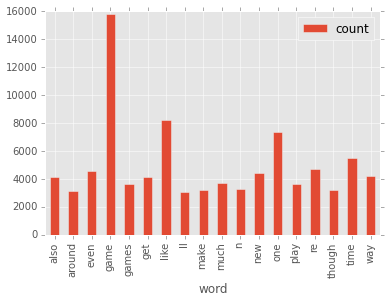

In [386]:
w_plot.plot(kind='bar')